In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/rainfall-in-india/rainfall in india 1901-2015.csv
/kaggle/input/rainfall-in-india/district wise rainfall normal.csv


**Importing modules**

In [2]:
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns

In [3]:
India = pd.read_csv("../input/rainfall-in-india/rainfall in india 1901-2015.csv",sep=",")

In [4]:
India.head()

,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
0,ANDAMAN & NICOBAR ISLANDS,1901,49.2,87.1,29.2,2.3,528.8,517.5,365.1,481.1,332.6,388.5,558.2,33.6,3373.2,136.3,560.3,1696.3,980.3
1,ANDAMAN & NICOBAR ISLANDS,1902,0.0,159.8,12.2,0.0,446.1,537.1,228.9,753.7,666.2,197.2,359.0,160.5,3520.7,159.8,458.3,2185.9,716.7
2,ANDAMAN & NICOBAR ISLANDS,1903,12.7,144.0,0.0,1.0,235.1,479.9,728.4,326.7,339.0,181.2,284.4,225.0,2957.4,156.7,236.1,1874.0,690.6
3,ANDAMAN & NICOBAR ISLANDS,1904,9.4,14.7,0.0,202.4,304.5,495.1,502.0,160.1,820.4,222.2,308.7,40.1,3079.6,24.1,506.9,1977.6,571.0
4,ANDAMAN & NICOBAR ISLANDS,1905,1.3,0.0,3.3,26.9,279.5,628.7,368.7,330.5,297.0,260.7,25.4,344.7,2566.7,1.3,309.7,1624.9,630.8


In [5]:
print('Rows     :',India.shape[0])
print('Columns  :',India.shape[1])
print('\nFeatures :\n     :',India.columns.tolist())
print('\nMissing values    :',India.isnull().values.sum())
print('\nUnique values :  \n',India.nunique())

Rows     : 4116
Columns  : 19

Features :
     : ['SUBDIVISION', 'YEAR', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC', 'ANNUAL', 'Jan-Feb', 'Mar-May', 'Jun-Sep', 'Oct-Dec']

Missing values    : 134

Unique values :  
 SUBDIVISION      36
YEAR            115
JAN             802
FEB             898
MAR             978
APR            1234
MAY            1731
JUN            2722
JUL            3050
AUG            2913
SEP            2632
OCT            1939
NOV            1239
DEC             801
ANNUAL         3712
Jan-Feb        1220
Mar-May        2262
Jun-Sep        3683
Oct-Dec        2389
dtype: int64


,Total,Percent
ANNUAL,26,0.006317
Oct-Dec,13,0.003158
NOV,11,0.002672
DEC,10,0.002430
Jun-Sep,10,0.002430


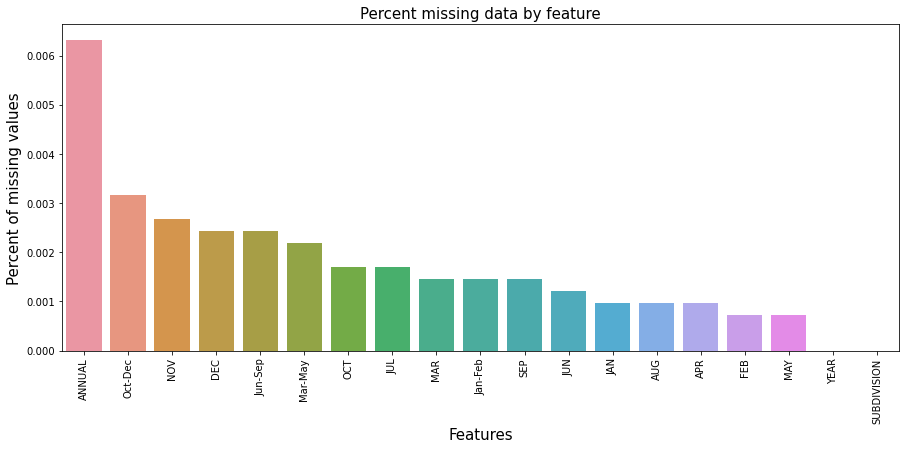

In [6]:
total = India.isnull().sum().sort_values(ascending=False)
percent = (India.isnull().sum()/India.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
f, ax = plt.subplots(figsize=(15, 6))
plt.xticks(rotation='90')
sns.barplot(x=missing_data.index, y=missing_data['Percent'])
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)
missing_data.head()

In [7]:
India.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4116 entries, 0 to 4115
Data columns (total 19 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   SUBDIVISION  4116 non-null   object 
 1   YEAR         4116 non-null   int64  
 2   JAN          4112 non-null   float64
 3   FEB          4113 non-null   float64
 4   MAR          4110 non-null   float64
 5   APR          4112 non-null   float64
 6   MAY          4113 non-null   float64
 7   JUN          4111 non-null   float64
 8   JUL          4109 non-null   float64
 9   AUG          4112 non-null   float64
 10  SEP          4110 non-null   float64
 11  OCT          4109 non-null   float64
 12  NOV          4105 non-null   float64
 13  DEC          4106 non-null   float64
 14  ANNUAL       4090 non-null   float64
 15  Jan-Feb      4110 non-null   float64
 16  Mar-May      4107 non-null   float64
 17  Jun-Sep      4106 non-null   float64
 18  Oct-Dec      4103 non-null   float64
dtypes: flo

In [8]:
India['JAN'].fillna((India['JAN'].mean()), inplace=True)
India['FEB'].fillna((India['FEB'].mean()), inplace=True)
India['MAR'].fillna((India['MAR'].mean()), inplace=True)
India['APR'].fillna((India['APR'].mean()), inplace=True)
India['MAY'].fillna((India['MAY'].mean()), inplace=True)
India['JUN'].fillna((India['JUN'].mean()), inplace=True)
India['JUL'].fillna((India['JUL'].mean()), inplace=True)
India['AUG'].fillna((India['AUG'].mean()), inplace=True)
India['SEP'].fillna((India['SEP'].mean()), inplace=True)
India['OCT'].fillna((India['OCT'].mean()), inplace=True)
India['NOV'].fillna((India['NOV'].mean()), inplace=True)
India['DEC'].fillna((India['DEC'].mean()), inplace=True)
India['ANNUAL'].fillna((India['ANNUAL'].mean()), inplace=True)
India['Jan-Feb'].fillna((India['Jan-Feb'].mean()), inplace=True)
India['Mar-May'].fillna((India['Mar-May'].mean()), inplace=True)
India['Jun-Sep'].fillna((India['Jun-Sep'].mean()), inplace=True)
India['Oct-Dec'].fillna((India['Oct-Dec'].mean()), inplace=True)

In [9]:
India.describe().T

,count,mean,std,min,25%,50%,75%,max
YEAR,4116.0,1958.218659,33.140898,1901.0,1930.000,1958.00,1987.000,2015.0
JAN,4116.0,18.957320,33.569044,0.0,0.600,6.00,22.125,583.7
FEB,4116.0,21.805325,35.896396,0.0,0.600,6.70,26.800,403.5
MAR,4116.0,27.359197,46.925176,0.0,1.000,7.90,31.225,605.6
APR,4116.0,43.127432,67.798192,0.0,3.000,15.70,49.825,595.1
MAY,4116.0,85.745417,123.189974,0.0,8.600,36.70,96.825,1168.6
JUN,4116.0,230.234444,234.568120,0.4,70.475,138.90,304.950,1609.9
JUL,4116.0,347.214334,269.310313,0.0,175.900,284.90,418.225,2362.8
AUG,4116.0,290.263497,188.678707,0.0,156.150,259.50,377.725,1664.6
SEP,4116.0,197.361922,135.309591,0.1,100.600,174.10,265.725,1222.0


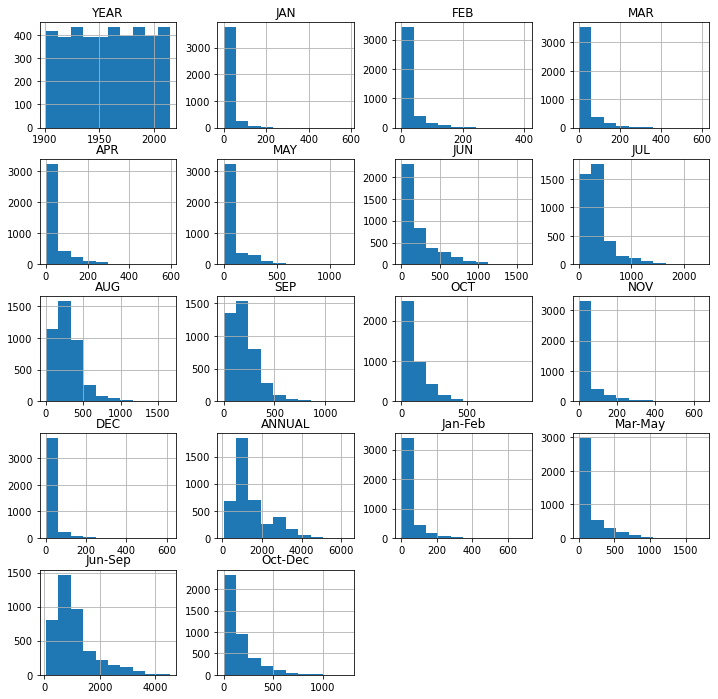

In [10]:
India.hist(figsize=(12,12));

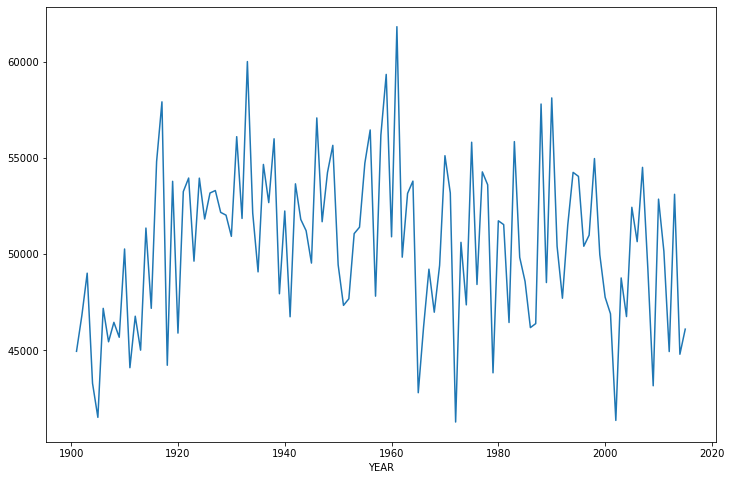

In [11]:
India.groupby("YEAR").sum()['ANNUAL'].plot(figsize=(12,8));

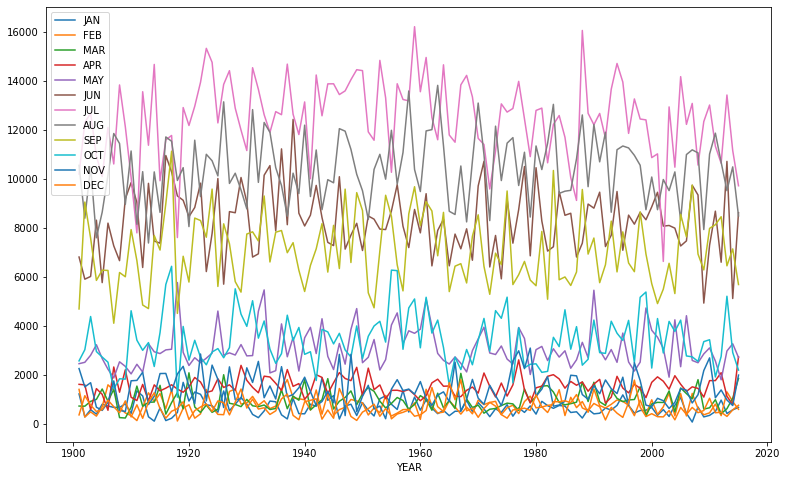

In [12]:
India[['YEAR', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].groupby("YEAR").sum().plot(figsize=(13,8));

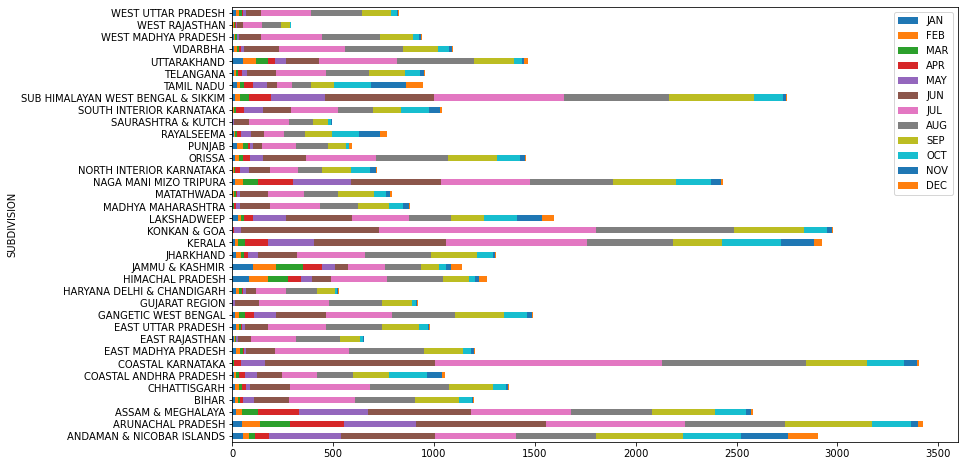

In [13]:
India[['SUBDIVISION', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].groupby("SUBDIVISION").mean().plot.barh(stacked=True,figsize=(13,8));

**Graph shows top 3 subdivisions having high average rainfall:**

1. ARUNACHAL PRADESH
1. COASTAL KARNATAKA
1. KONKAN & GOA

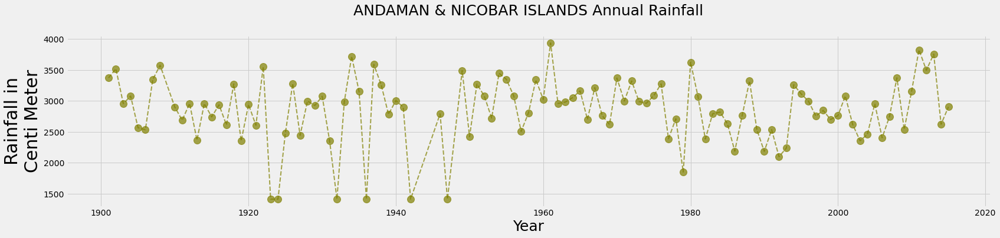

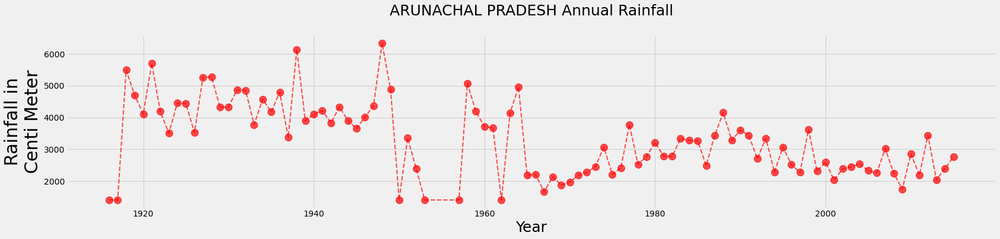

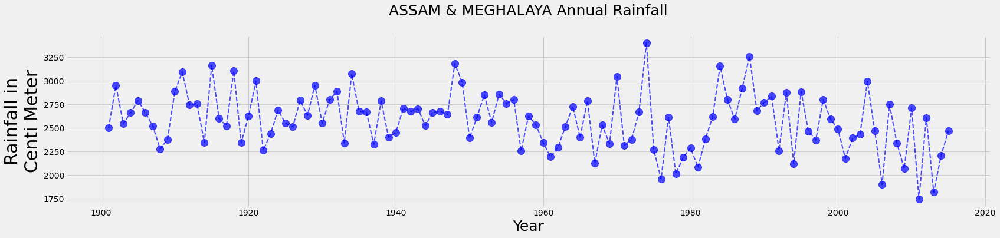

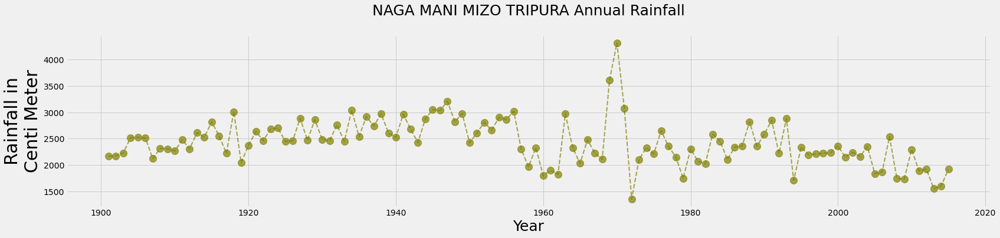

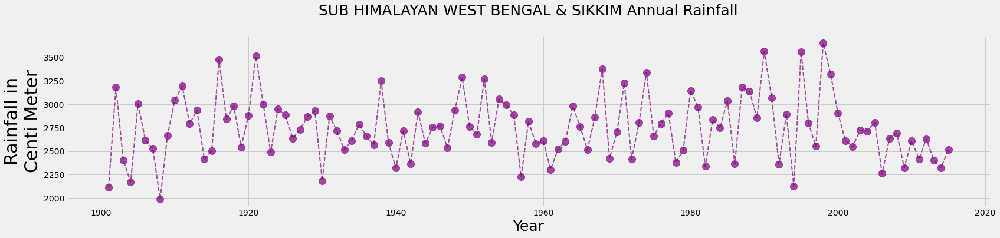

...

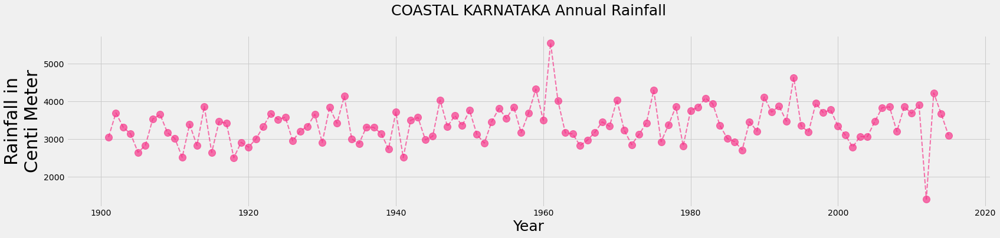

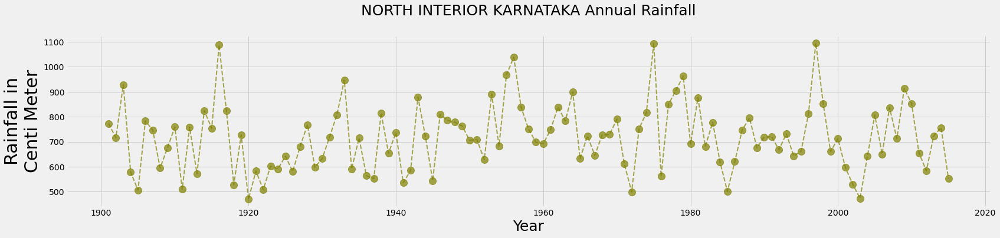

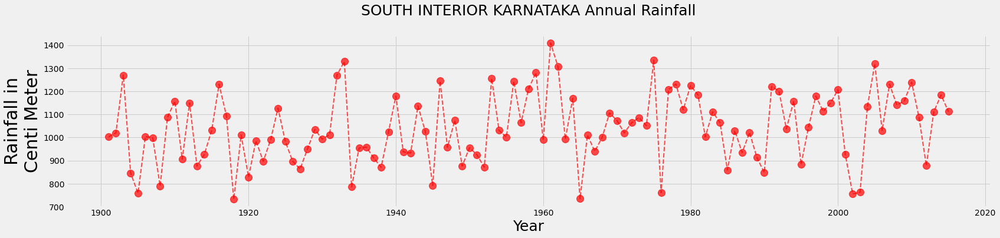

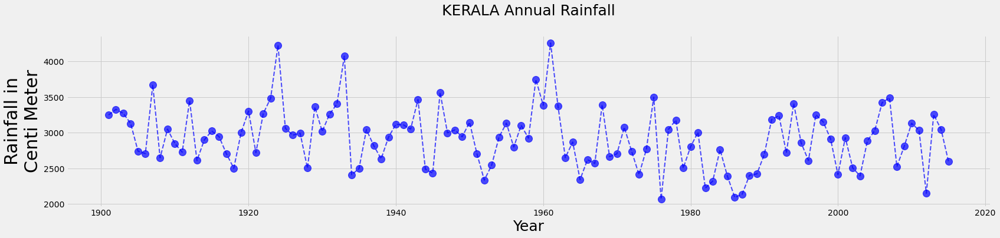

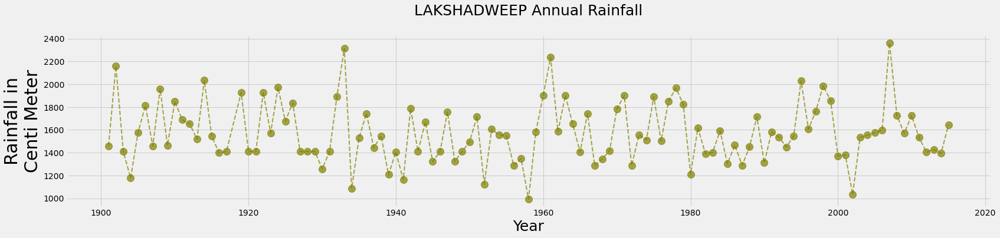

In [14]:
def _SUBDIVISION(column,division):
        Year = []
        annual = []
        for i in range(len(column)):
            if column[i] == division:
                if 'nan'!= str(India["ANNUAL"][i]) and 'NAN' != str(India["ANNUAL"][i]):
                    Year.append(India["YEAR"][i])
                    annual.append((India["ANNUAL"][i]))
        return Year,annual
colors = ["#808000","#FF0000","#0000FF","#808000","#800080","#008000","#800000","#A52A2A","#FFA500","#000000","#151B54","#FBB917","#806517","#C11B17",
          "#810541","#F6358A","#808000","#FF0000","#0000FF","#808000","#800080","#008000","#800000","#A52A2A","#FFA500","#000000","#151B54","#FBB917",
          "#806517","#C11B17","#810541","#F6358A","#808000","#FF0000","#0000FF","#808000"]
country = India["SUBDIVISION"].unique()
for i in range(len(country)):
    Year, annual = _SUBDIVISION(India["SUBDIVISION"],str(country[i]))
    plt.style.use('fivethirtyeight')
    plt.rcParams['figure.figsize']=(25,5)
    plt.plot(Year, annual, color=colors[i] ,alpha = 0.7, marker='o', linestyle='dashed',linewidth=2, markersize=12)
    plt.title(str(country[i])+" Annual Rainfall\n", size= 25)
    plt.xlabel("Year", size= 25)
    plt.ylabel("Rainfall in\nCenti Meter", size= 30)
    plt.show()

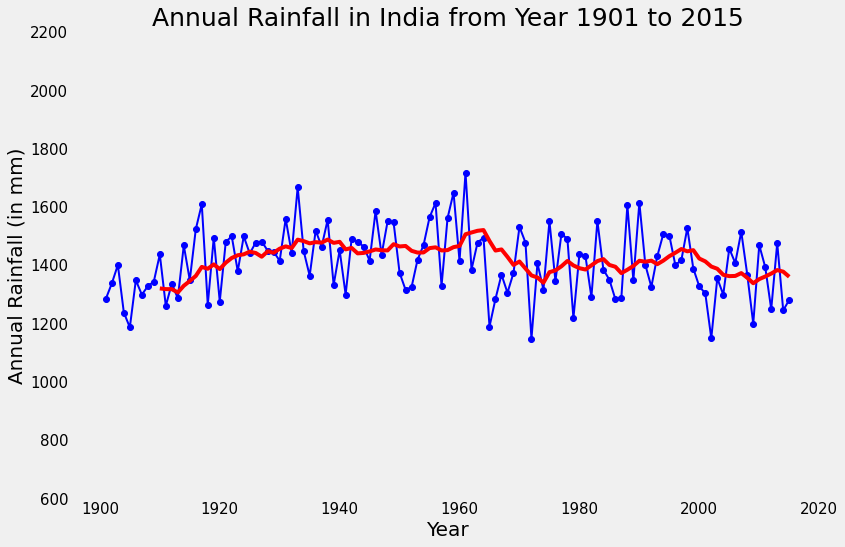

In [15]:
ax=India.groupby("YEAR").mean()['ANNUAL'].plot(ylim=(600,2200),color='b',marker='o',linestyle='-',linewidth=2,figsize=(12,8));
India['MA10'] = India.groupby('YEAR').mean()['ANNUAL'].rolling(10).mean()
India.MA10.plot(color='r',linewidth=4)
plt.xlabel('Year',fontsize=20)
plt.ylabel('Annual Rainfall (in mm)',fontsize=20)
plt.title('Annual Rainfall in India from Year 1901 to 2015',fontsize=25)
ax.tick_params(labelsize=15)
plt.grid()
plt.ioff()

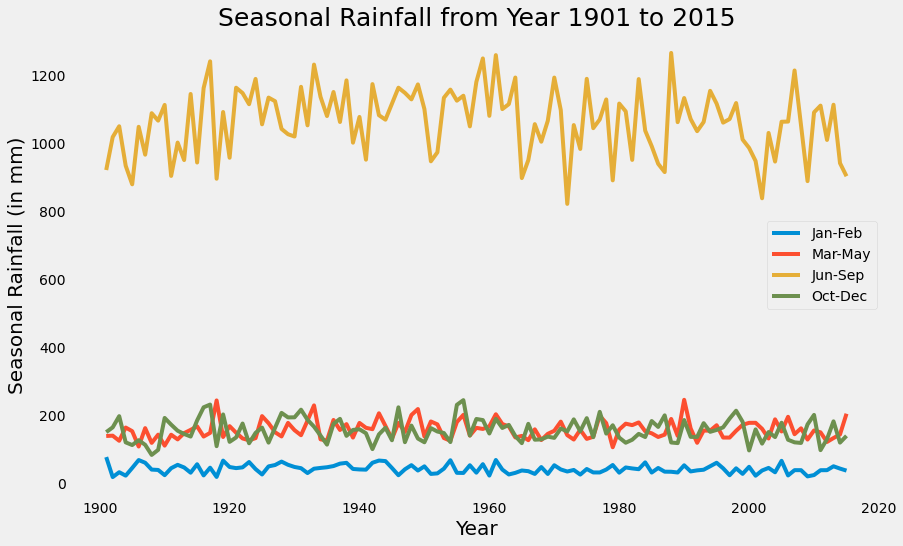

In [16]:
India[['YEAR','Jan-Feb', 'Mar-May',
       'Jun-Sep', 'Oct-Dec']].groupby("YEAR").mean().plot(figsize=(13,8));
plt.xlabel('Year',fontsize=20)
plt.ylabel('Seasonal Rainfall (in mm)',fontsize=20)
plt.title('Seasonal Rainfall from Year 1901 to 2015',fontsize=25)
ax.tick_params(labelsize=15)
plt.grid()
plt.ioff()

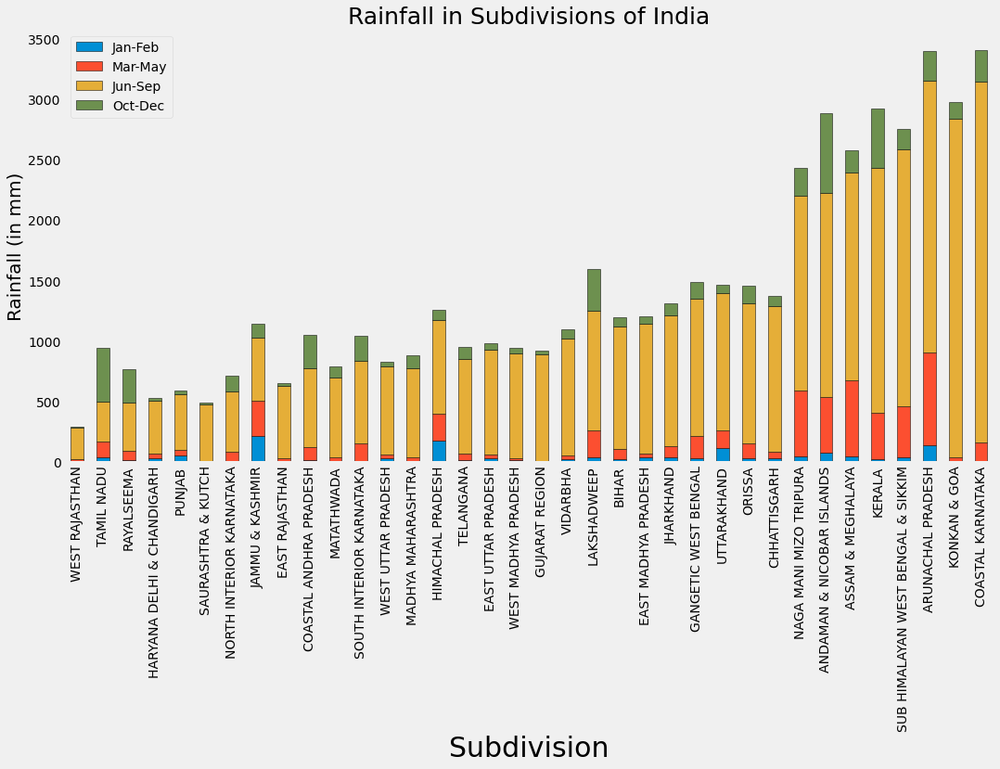

In [17]:
India[['SUBDIVISION', 'Jan-Feb', 'Mar-May',
       'Jun-Sep', 'Oct-Dec']].groupby("SUBDIVISION").mean().sort_values('Jun-Sep').plot.bar(width=0.5,edgecolor='k',align='center',stacked=True,figsize=(16,8));
plt.xlabel('Subdivision',fontsize=30)
plt.ylabel('Rainfall (in mm)',fontsize=20)
plt.title('Rainfall in Subdivisions of India',fontsize=25)
ax.tick_params(labelsize=15)
plt.grid()
plt.ioff()

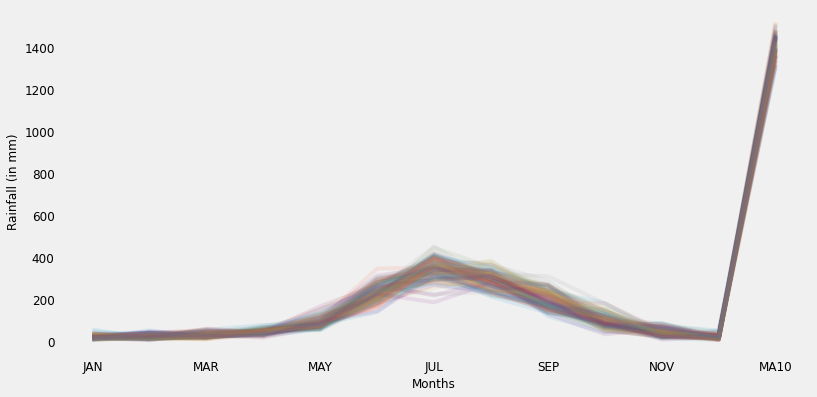

In [18]:
drop_col = ['ANNUAL','Jan-Feb','Mar-May','Jun-Sep','Oct-Dec']

fig, ax = plt.subplots()

(India.groupby(by='YEAR')
 .mean()
 .drop(drop_col, axis=1)
 .T
 .plot(alpha=0.1, figsize=(12, 6), legend=False, fontsize=12, ax=ax)
)
ax.set_xlabel('Months', fontsize=12)
ax.set_ylabel('Rainfall (in mm)', fontsize=12)
plt.grid()
plt.ioff()

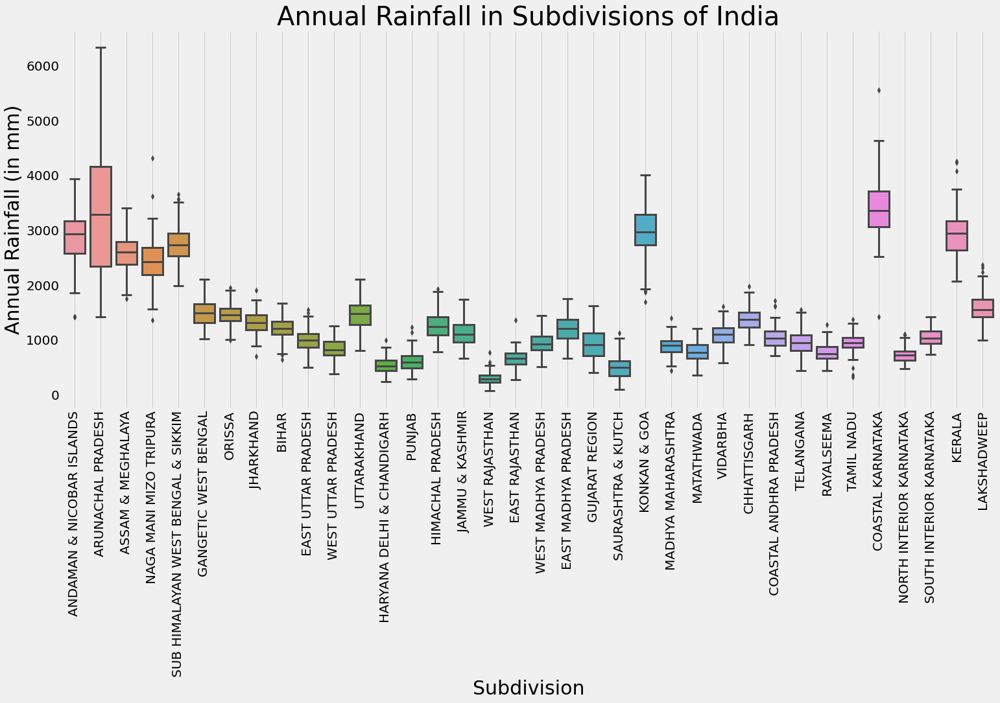

In [19]:
plt.rcParams['figure.figsize']=(23,10)
ax = sns.boxplot(x="SUBDIVISION", y="ANNUAL", data=India,width=0.8,linewidth=3)
ax.set_xlabel('Subdivision',fontsize=30)
ax.set_ylabel('Annual Rainfall (in mm)',fontsize=30)
plt.title('Annual Rainfall in Subdivisions of India',fontsize=40)
ax.tick_params(axis='x',labelsize=20,rotation=90)
ax.tick_params(axis='y',labelsize=20,rotation=0)
plt.grid()
plt.ioff()

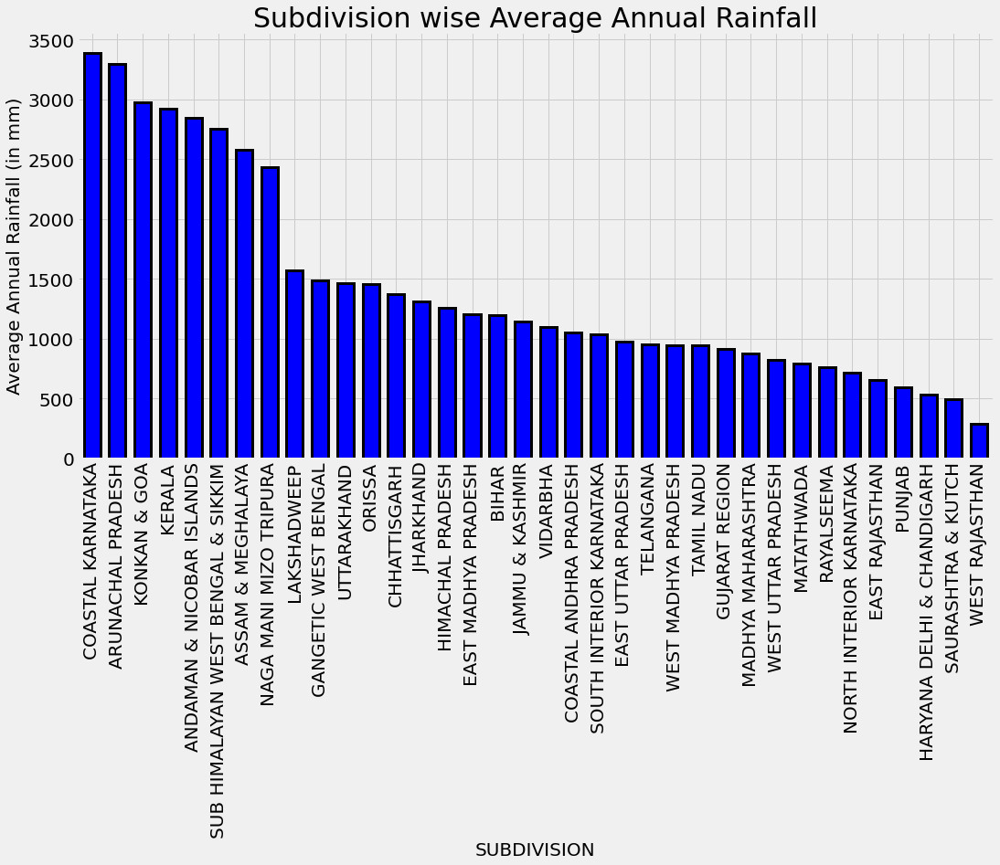

In [20]:
fig = plt.figure(figsize=(16,8))
ax = fig.add_subplot(111)
India.groupby('SUBDIVISION').mean().sort_values(by='ANNUAL', ascending=False)['ANNUAL'].plot(kind='bar', color='b',width=0.65,linewidth=3,edgecolor='k',align='center',title='Subdivision wise Average Annual Rainfall', fontsize=20)
plt.xticks(rotation = 90)
plt.ylabel('Average Annual Rainfall (in mm)')
ax.title.set_fontsize(30)
ax.xaxis.label.set_fontsize(20)
ax.yaxis.label.set_fontsize(20)

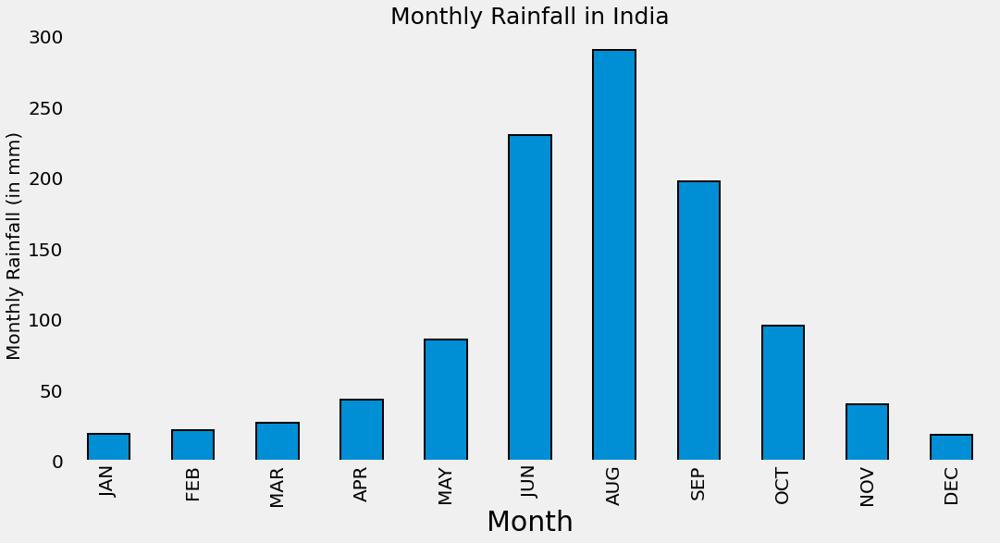

In [21]:
ax=India[['JAN', 'FEB', 'MAR', 'APR','MAY', 'JUN', 'AUG', 'SEP', 'OCT','NOV','DEC']].mean().plot.bar(width=0.5,edgecolor='k',align='center',linewidth=2,figsize=(16,8))
plt.xlabel('Month',fontsize=30)
plt.ylabel('Monthly Rainfall (in mm)',fontsize=20)
plt.title('Monthly Rainfall in India',fontsize=25)
ax.tick_params(labelsize=20)
plt.grid()
plt.ioff()

In [22]:
India[['AUG']].mean()

AUG    290.263497
dtype: float64

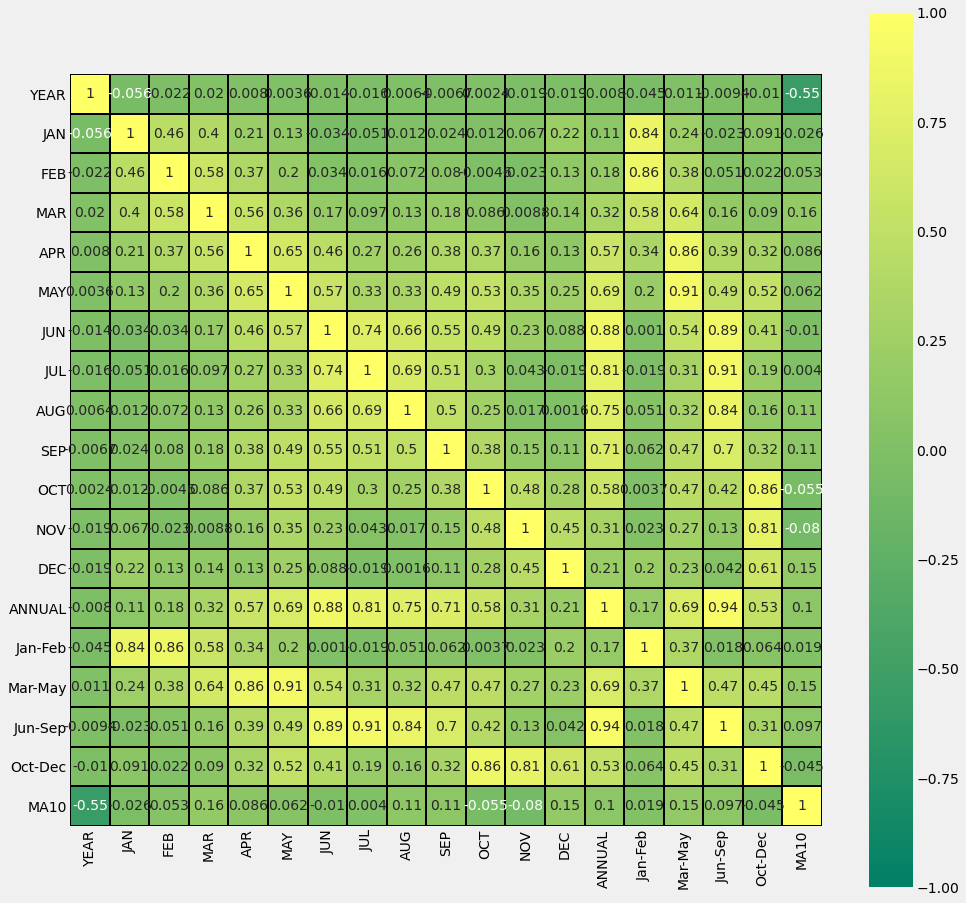

In [23]:
fig=plt.gcf()
fig.set_size_inches(15,15)
fig=sns.heatmap(India.corr(),annot=True,cmap='summer',linewidths=1,linecolor='k',square=True,mask=False, vmin=-1, vmax=1,cbar_kws={"orientation": "vertical"},cbar=True)

In [24]:
Kerala =India[India.SUBDIVISION == 'KERALA']
#Kerala

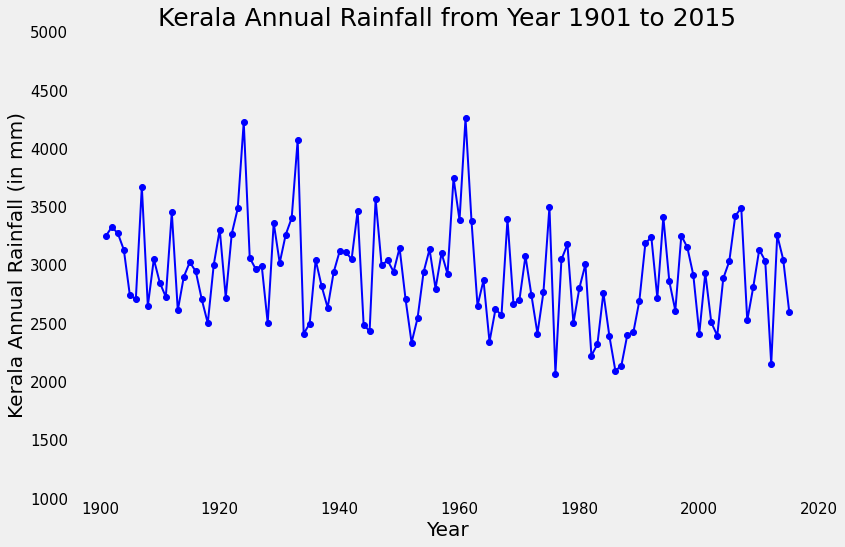

In [25]:
ax=Kerala.groupby("YEAR").mean()['ANNUAL'].plot(ylim=(1000,5000),color='b',marker='o',linestyle='-',linewidth=2,figsize=(12,8));
#Kerala['MA10'] = Kerala.groupby('YEAR').mean()['ANNUAL'].rolling(10).mean()
#Kerala.MA10.plot(color='r',linewidth=4)
plt.xlabel('Year',fontsize=20)
plt.ylabel('Kerala Annual Rainfall (in mm)',fontsize=20)
plt.title('Kerala Annual Rainfall from Year 1901 to 2015',fontsize=25)
ax.tick_params(labelsize=15)
plt.grid()
plt.ioff()

In [26]:
print('Average annual rainfall received by Kerala=',int(Kerala['ANNUAL'].mean()),'mm')

Average annual rainfall received by Kerala= 2925 mm


In [27]:
print('Kerala received 4257.8 mm of rain in the year 1961')
a=Kerala[Kerala['YEAR']==1961]
a

Kerala received 4257.8 mm of rain in the year 1961


,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec,MA10
3947,KERALA,1961,13.7,31.3,11.4,94.1,500.5,1005.2,1146.5,678.3,399.3,274.2,85.9,17.5,4257.8,45.0,606.0,3229.3,377.6,NaN


In [28]:
print('Kerala received 4226.4 mm of rain in the year 1924')
b=Kerala[Kerala['YEAR']==1924]
b

Kerala received 4226.4 mm of rain in the year 1924


,SUBDIVISION,YEAR,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec,MA10
3910,KERALA,1924,19.3,2.9,66.6,111.0,185.4,1011.7,1526.5,624.0,289.1,176.5,162.9,50.4,4226.4,22.2,363.0,3451.3,389.9,NaN


In [29]:
Dist = pd.read_csv("../input/rainfall-in-india/district wise rainfall normal.csv",sep=",")

In [30]:
Dist.head()

,STATE_UT_NAME,DISTRICT,JAN,FEB,MAR,APR,MAY,JUN,JUL,AUG,SEP,OCT,NOV,DEC,ANNUAL,Jan-Feb,Mar-May,Jun-Sep,Oct-Dec
0,ANDAMAN And NICOBAR ISLANDS,NICOBAR,107.3,57.9,65.2,117.0,358.5,295.5,285.0,271.9,354.8,326.0,315.2,250.9,2805.2,165.2,540.7,1207.2,892.1
1,ANDAMAN And NICOBAR ISLANDS,SOUTH ANDAMAN,43.7,26.0,18.6,90.5,374.4,457.2,421.3,423.1,455.6,301.2,275.8,128.3,3015.7,69.7,483.5,1757.2,705.3
2,ANDAMAN And NICOBAR ISLANDS,N & M ANDAMAN,32.7,15.9,8.6,53.4,343.6,503.3,465.4,460.9,454.8,276.1,198.6,100.0,2913.3,48.6,405.6,1884.4,574.7
3,ARUNACHAL PRADESH,LOHIT,42.2,80.8,176.4,358.5,306.4,447.0,660.1,427.8,313.6,167.1,34.1,29.8,3043.8,123.0,841.3,1848.5,231.0
4,ARUNACHAL PRADESH,EAST SIANG,33.3,79.5,105.9,216.5,323.0,738.3,990.9,711.2,568.0,206.9,29.5,31.7,4034.7,112.8,645.4,3008.4,268.1


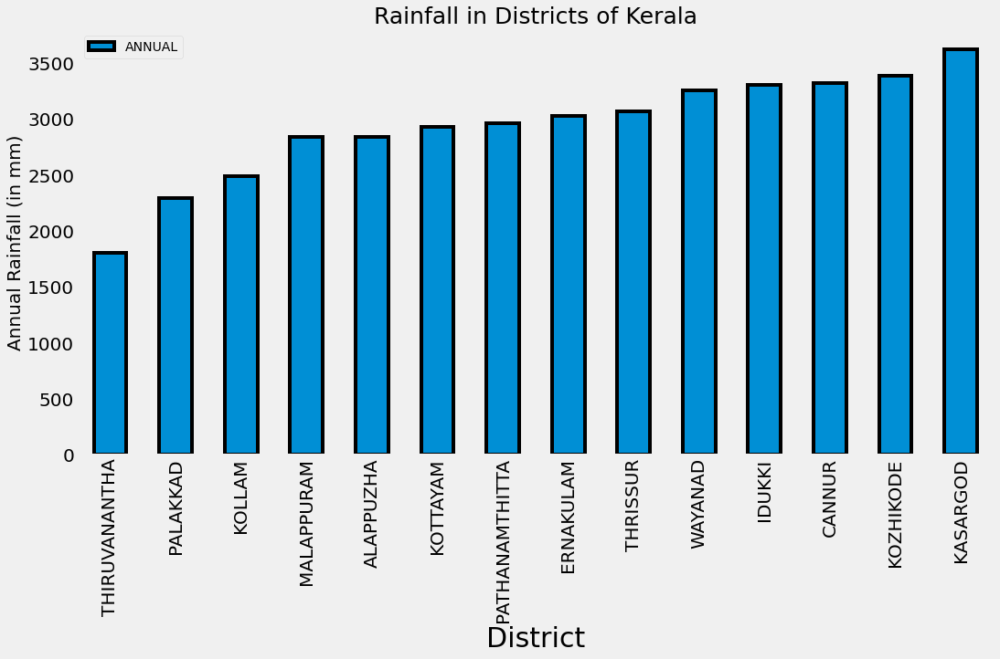

In [31]:
KDist=Dist[Dist.STATE_UT_NAME == 'KERALA']
k=KDist.sort_values(by=['ANNUAL'])
ax=k.plot.bar(x='DISTRICT',y='ANNUAL',width=0.5,edgecolor='k',align='center',linewidth=4,figsize=(16,8))
plt.xlabel('District',fontsize=30)
plt.ylabel('Annual Rainfall (in mm)',fontsize=20)
plt.title('Rainfall in Districts of Kerala',fontsize=25)
ax.tick_params(labelsize=20)
plt.grid()
plt.ioff()

In [32]:
Dist.groupby(['DISTRICT'])['ANNUAL'].max().sort_values().head(5)

DISTRICT
LADAKH (LEH)      94.6
JAISALMER        181.2
KARGIL           223.3
SRI GANGANAGA    252.9
BARMER           268.6
Name: ANNUAL, dtype: float64

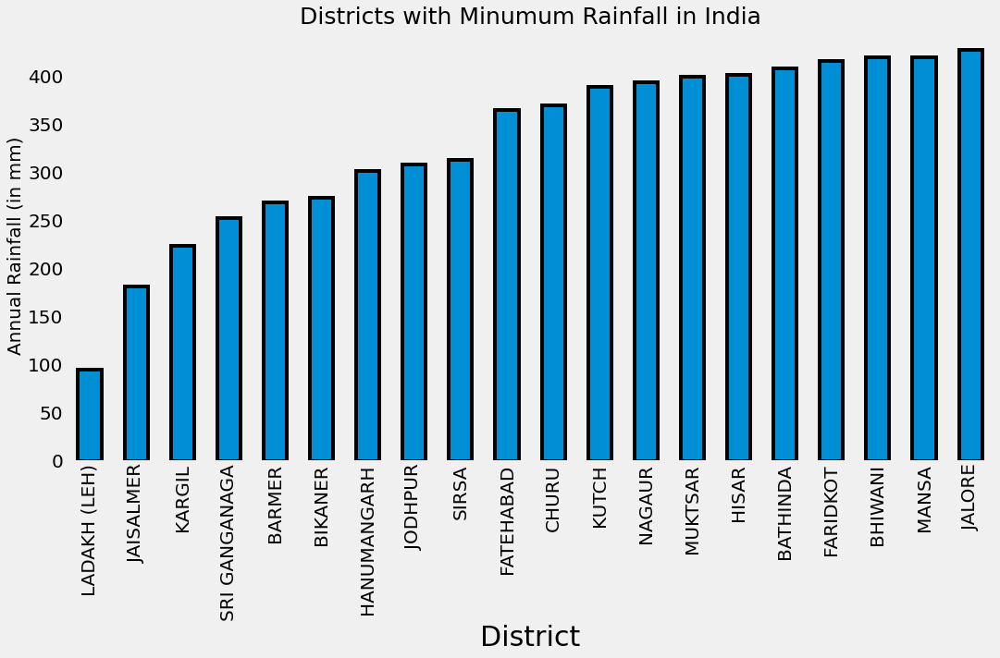

In [33]:
ax=Dist.groupby(['DISTRICT'])['ANNUAL'].max().sort_values().head(20).plot.bar(width=0.5,edgecolor='k',align='center',linewidth=4,figsize=(16,8))
#ax=k.plot.bar(x='DISTRICT',y='ANNUAL',width=0.5,edgecolor='k',align='center',linewidth=4,figsize=(16,8))
plt.xlabel('District',fontsize=30)
plt.ylabel('Annual Rainfall (in mm)',fontsize=20)
plt.title('Districts with Minumum Rainfall in India',fontsize=25)
ax.tick_params(labelsize=20)
plt.grid()
plt.ioff()

In [34]:
Dist.groupby(['DISTRICT'])['ANNUAL'].max().sort_values().tail(5)

DISTRICT
UDUPI            4306.0
UPPER SIANG      4402.1
EAST KHASI HI    6166.1
JAINTIA HILLS    6379.9
TAMENGLONG       7229.3
Name: ANNUAL, dtype: float64

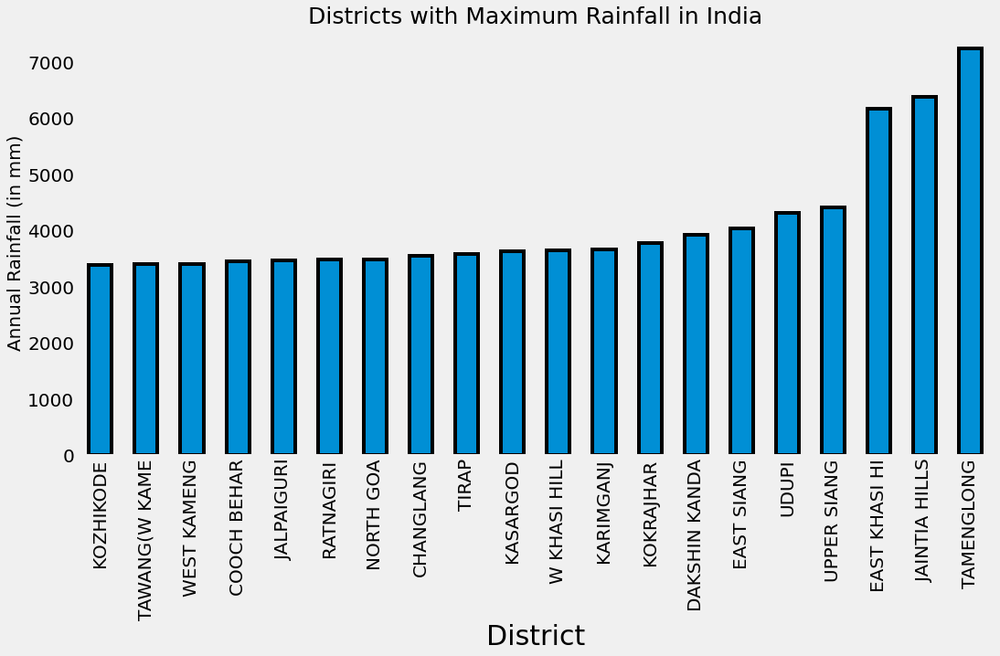

In [35]:
ax=Dist.groupby(['DISTRICT'])['ANNUAL'].max().sort_values().tail(20).plot.bar(width=0.5,edgecolor='k',align='center',linewidth=4,figsize=(16,8))
#ax=k.plot.bar(x='DISTRICT',y='ANNUAL',width=0.5,edgecolor='k',align='center',linewidth=4,figsize=(16,8))
plt.xlabel('District',fontsize=30)
plt.ylabel('Annual Rainfall (in mm)',fontsize=20)
plt.title('Districts with Maximum Rainfall in India',fontsize=25)
ax.tick_params(labelsize=20)
plt.grid()
plt.ioff()

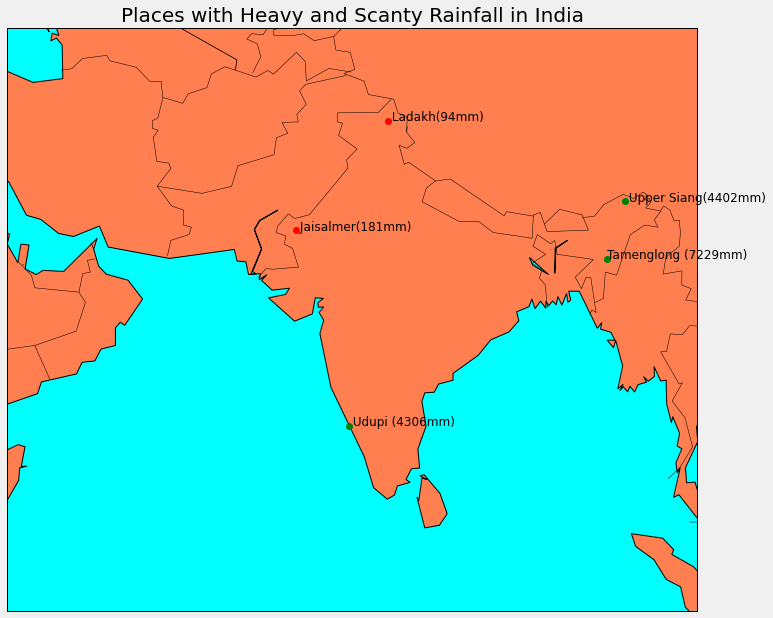

In [36]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
m=Basemap(projection='mill',llcrnrlat=0,urcrnrlat=40,llcrnrlon=50,urcrnrlon=100,resolution='c')
m.drawcoastlines()
m.drawcountries()
m.drawstates()
#m.fillcontinents()
m.fillcontinents(color='coral',lake_color='aqua')
#m.drawmapboundary()
m.drawmapboundary(fill_color='aqua')
#m.bluemarble()
#x, y = m(25.989836, 79.450035)
#plt.plot(x, y, 'go', markersize=5)
#plt.text(x, y, ' Trivandrum', fontsize=12);
lat,lon=13.340881,74.742142
x,y=m(lon,lat)
m.plot(x,y,'go')
plt.text(x, y, ' Udupi (4306mm)', fontsize=12);
lat,lon=28.879720,94.796970
x,y=m(lon,lat)
m.plot(x,y,'go')
plt.text(x, y, ' Upper Siang(4402mm)', fontsize=12);
"""lat,lon=25.578773,91.893257
x,y=m(lon,lat)
m.plot(x,y,'go')
plt.text(x, y, 'East Kashi Hills (6166mm)', fontsize=12);
lat,lon=25.389820,92.394913
x,y=m(lon,lat)
m.plot(x,y,'go')
plt.text(x, y, 'Jaintia Hills (6379mm)', fontsize=10);"""
lat,lon=24.987934,93.495293
x,y=m(lon,lat)
m.plot(x,y,'go')
plt.text(x, y, 'Tamenglong (7229mm)', fontsize=12);
lat,lon=34.136389,77.604139
x,y=m(lon,lat)
m.plot(x,y,'ro')
plt.text(x, y, ' Ladakh(94mm)', fontsize=12);
"""lat,lon=25.759859,71.382439
x,y=m(lon,lat)
m.plot(x,y,'ro')
plt.text(x, y, ' Barmer(268mm)', fontsize=12);"""
lat,lon=26.915749,70.908340
x,y=m(lon,lat)
m.plot(x,y,'ro')
plt.text(x, y, ' Jaisalmer(181mm)', fontsize=12);
plt.title('Places with Heavy and Scanty Rainfall in India',fontsize=20)
plt.ioff()
plt.show()

In [37]:
India.groupby("YEAR").mean()['ANNUAL'].sort_values(ascending=False).head(10)

YEAR
1961    1717.100000
1933    1666.750000
1959    1648.230556
1990    1614.294444
1956    1612.840000
1917    1608.628272
1988    1605.469444
1946    1585.419692
1955    1563.554286
1958    1560.669444
Name: ANNUAL, dtype: float64

In [38]:
India.groupby("YEAR").mean()['ANNUAL'].sort_values(ascending=False).tail(10)

YEAR
1911    1259.911429
2012    1248.208581
2014    1244.336111
1904    1236.771429
1979    1217.508333
2009    1198.822469
1965    1188.783333
1905    1186.177143
2002    1148.830556
1972    1146.488889
Name: ANNUAL, dtype: float64

**Month Wise Graph analysis**

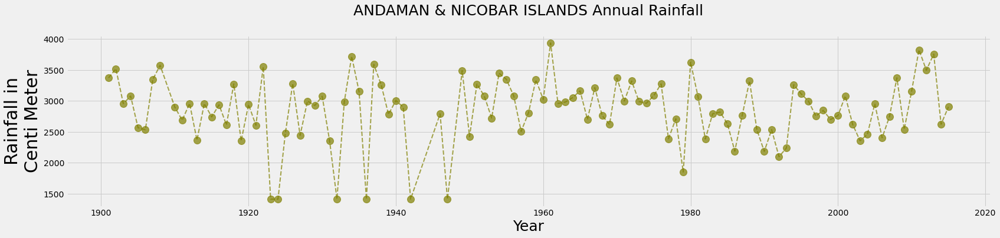

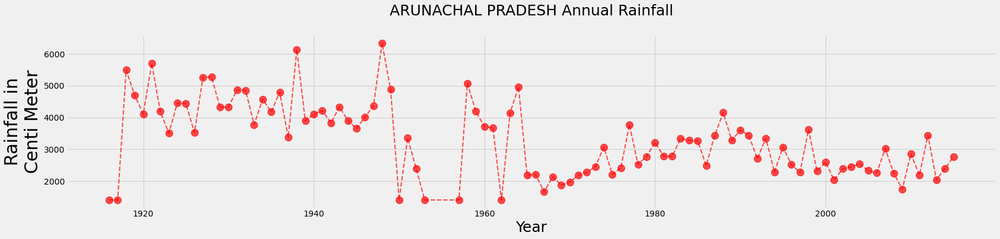

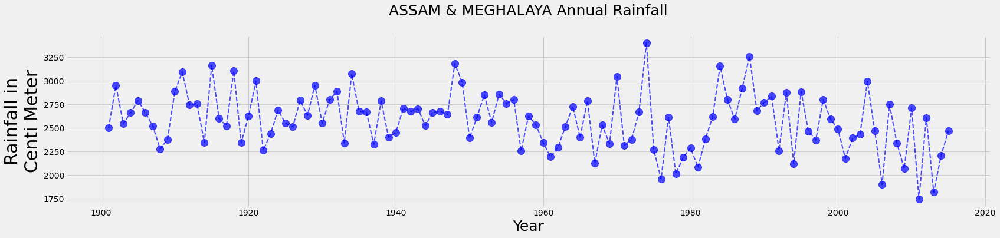

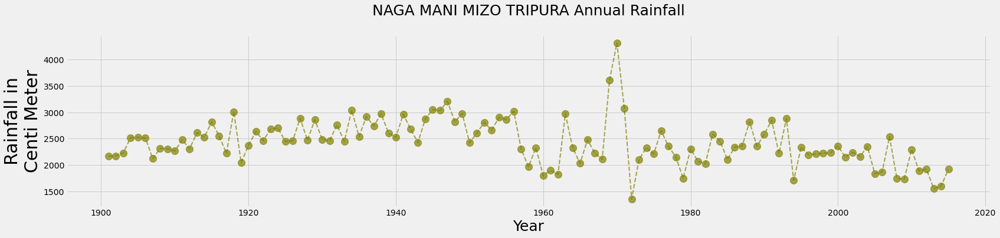

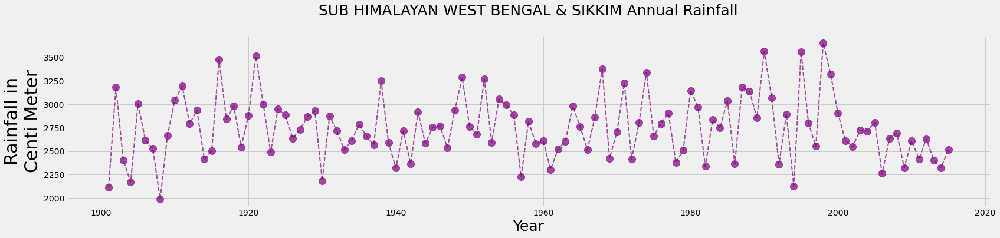

...

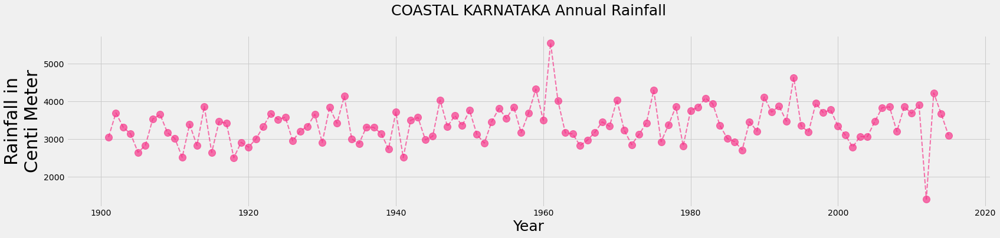

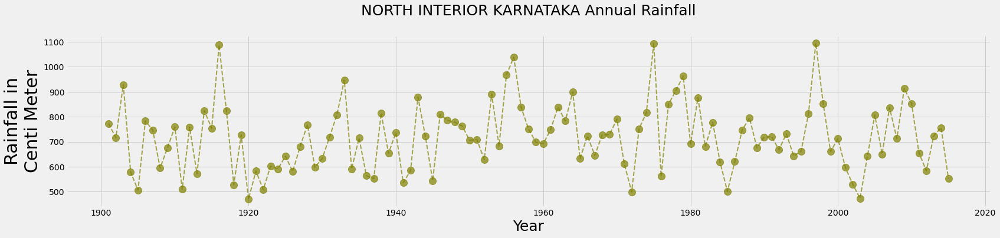

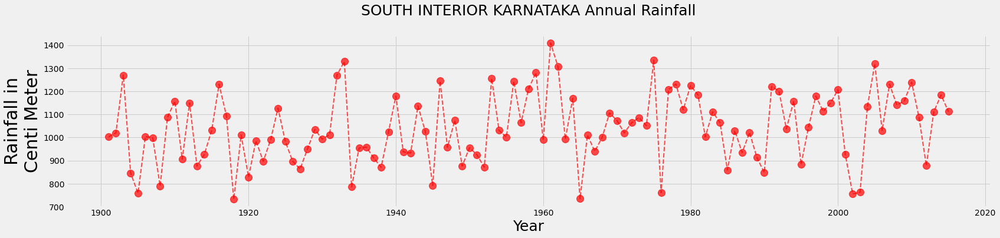

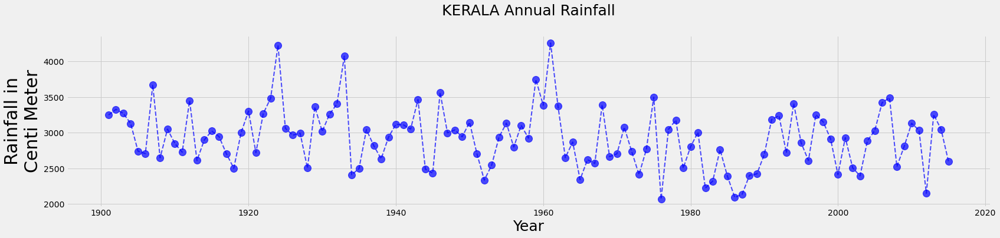

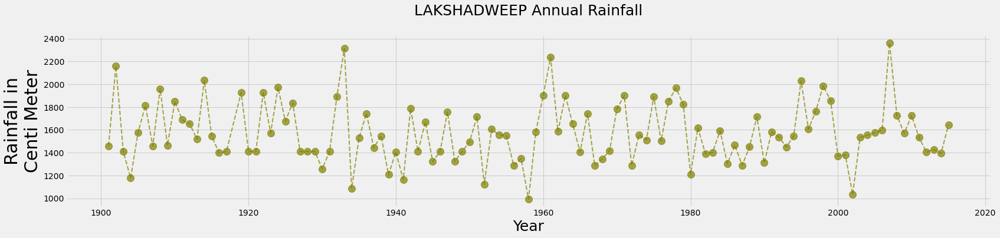

In [39]:
def _SUBDIVISION(column,division):
        Year = []
        annual = []
        for i in range(len(column)):
            if column[i] == division:
                if 'nan'!= str(India["ANNUAL"][i]) and 'NAN' != str(India["ANNUAL"][i]):
                    Year.append(India["YEAR"][i])
                    annual.append((India["ANNUAL"][i]))
        return Year,annual
colors = ["#808000","#FF0000","#0000FF","#808000","#800080","#008000","#800000","#A52A2A","#FFA500","#000000","#151B54","#FBB917","#806517","#C11B17",
          "#810541","#F6358A","#808000","#FF0000","#0000FF","#808000","#800080","#008000","#800000","#A52A2A","#FFA500","#000000","#151B54","#FBB917",
          "#806517","#C11B17","#810541","#F6358A","#808000","#FF0000","#0000FF","#808000"]
country = India["SUBDIVISION"].unique()
for i in range(len(country)):
    Year, annual = _SUBDIVISION(India["SUBDIVISION"],str(country[i]))
    plt.style.use('fivethirtyeight')
    plt.rcParams['figure.figsize']=(25,5)
    plt.plot(Year, annual, color=colors[i] ,alpha = 0.7, marker='o', linestyle='dashed',linewidth=2, markersize=12)
    plt.title(str(country[i])+" Annual Rainfall\n", size= 25)
    plt.xlabel("Year", size= 25)
    plt.ylabel("Rainfall in\nCenti Meter", size= 30)
    plt.show()

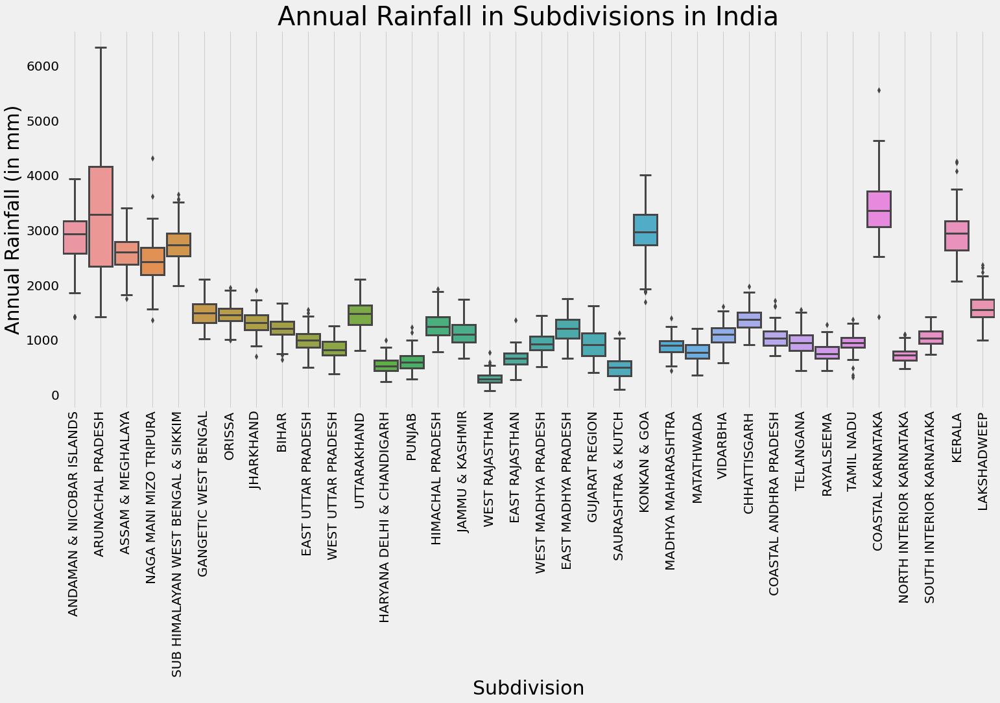

In [40]:
plt.rcParams['figure.figsize']=(23,10)
ax = sns.boxplot(x="SUBDIVISION", y="ANNUAL", data=India, width=0.9,linewidth=3)
ax.set_xlabel('Subdivision',fontsize=30)
ax.set_ylabel('Annual Rainfall (in mm)',fontsize=30)
plt.title('Annual Rainfall in Subdivisions in India',fontsize=40)
ax.tick_params(axis='x',labelsize=20,rotation=90)
ax.tick_params(axis='y',labelsize=20,rotation=0)
plt.grid()
plt.ioff()

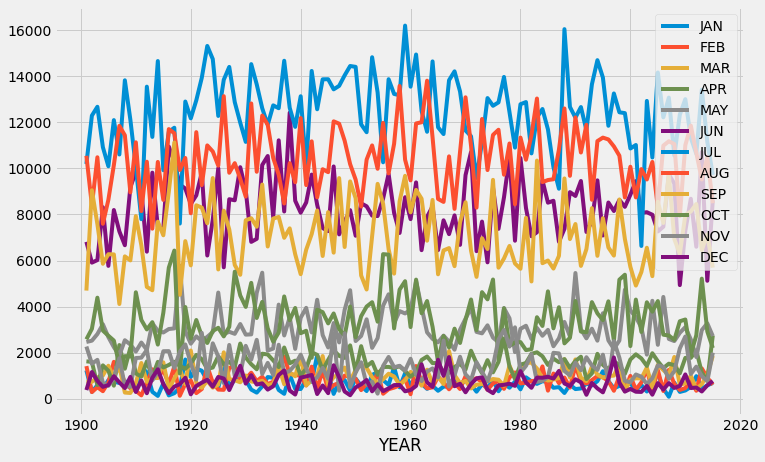

In [41]:
India[['YEAR', 'JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].groupby("YEAR").sum().plot(figsize=(11,7));

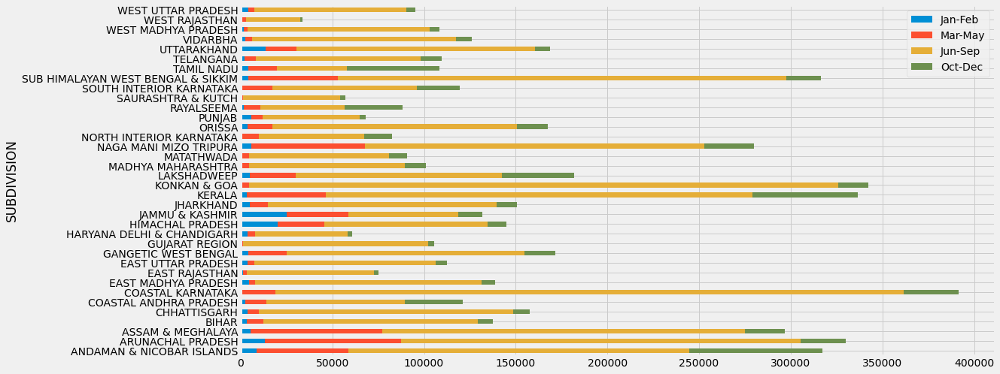

In [42]:
India[['SUBDIVISION', 'Jan-Feb', 'Mar-May',
       'Jun-Sep', 'Oct-Dec']].groupby("SUBDIVISION").sum().plot.barh(stacked=True,figsize=(16,8));

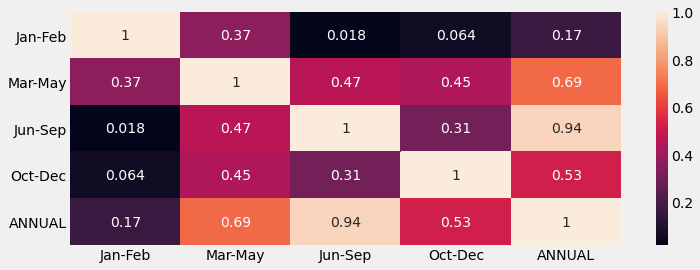

In [43]:
plt.figure(figsize=(11,4))
sns.heatmap(India[['Jan-Feb','Mar-May','Jun-Sep','Oct-Dec','ANNUAL']].corr(),annot=True)
plt.show()

**PREDICTIONS**

In [44]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
import numpy as np
division_data = np.asarray(India[['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']])

X = None; y = None
for i in range(division_data.shape[1]-3):
    if X is None:
        X = division_data[:, i:i+3]
        y = division_data[:, i+3]
    else:
        X = np.concatenate((X, division_data[:, i:i+3]), axis=0)
        y = np.concatenate((y, division_data[:, i+3]), axis=0)
        
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

In [45]:
temp = India[['SUBDIVISION','JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].loc[India['YEAR'] == 2010]

data_2010 = np.asarray(temp[['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].loc[temp['SUBDIVISION'] == 'TELANGANA'])

X_year_2010 = None; y_year_2010 = None
for i in range(data_2010.shape[1]-3):
    if X_year_2010 is None:
        X_year_2010 = data_2010[:, i:i+3]
        y_year_2010 = data_2010[:, i+3]
    else:
        X_year_2010 = np.concatenate((X_year_2010, data_2010[:, i:i+3]), axis=0)
        y_year_2010 = np.concatenate((y_year_2010, data_2010[:, i+3]), axis=0)

In [46]:
#terst 2015
temp = India[['SUBDIVISION','JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].loc[India['YEAR'] == 2015]

data_2015 = np.asarray(temp[['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].loc[temp['SUBDIVISION'] == 'TELANGANA'])

X_year_2015 = None; y_year_2015 = None
for i in range(data_2015.shape[1]-3):
    if X_year_2015 is None:
        X_year_2015 = data_2015[:, i:i+3]
        y_year_2015 = data_2015[:, i+3]
    else:
        X_year_2015 = np.concatenate((X_year_2015, data_2015[:, i:i+3]), axis=0)
        y_year_2015 = np.concatenate((y_year_2015, data_2015[:, i+3]), axis=0)

In [47]:
temp = India[['SUBDIVISION','JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].loc[India['YEAR'] == 2005]

data_2005 = np.asarray(temp[['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].loc[temp['SUBDIVISION'] == 'TELANGANA'])

X_year_2005 = None; y_year_2005 = None
for i in range(data_2005.shape[1]-3):
    if X_year_2005 is None:
        X_year_2005 = data_2005[:, i:i+3]
        y_year_2005 = data_2005[:, i+3]
    else:
        X_year_2005 = np.concatenate((X_year_2005, data_2005[:, i:i+3]), axis=0)
        y_year_2005 = np.concatenate((y_year_2005, data_2005[:, i+3]), axis=0)

## 1.LINEAR MODEL

**Linear model is used in different ways according to the context. The most common occurrence is in connection with regression models and the term is often taken as synonymous with linear regression model. However, the term is also used in time series analysis with a different meaning. In each case, the designation "linear" is used to identify a subclass of models for which substantial reduction in the complexity of the related statistical theory is possible.**

In [48]:
from sklearn import linear_model

# linear model
reg = linear_model.ElasticNet(alpha=0.5)
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)

In [49]:
#2005
y_year_pred_2005 = reg.predict(X_year_2005)


#2010
y_year_pred_2010 = reg.predict(X_year_2010)
    
y_year_pred_2015 = reg.predict(X_year_2015)

print ("MEAN 2005")
print (np.mean(y_year_2005),np.mean(y_year_pred_2005))
print ("Standard deviation 2005")
print (np.sqrt(np.var(y_year_2005)),np.sqrt(np.var(y_year_pred_2005)))


print ("MEAN 2010")
print (np.mean(y_year_2010),np.mean(y_year_pred_2010))
print ("Standard deviation 2010")
print (np.sqrt(np.var(y_year_2010)),np.sqrt(np.var(y_year_pred_2010)))


print ("MEAN 2015")
print (np.mean(y_year_2015),np.mean(y_year_pred_2015))
print ("Standard deviation 2015")
print (np.sqrt(np.var(y_year_2015)),np.sqrt(np.var(y_year_pred_2015)))

MEAN 2005
121.2111111111111 134.68699821349804
Standard deviation 2005
123.77066107608005 90.8631023041644
MEAN 2010
139.93333333333334 144.80501326515912
Standard deviation 2010
135.71320250194282 95.94931363601727
MEAN 2015
88.52222222222223 119.64752006738826
Standard deviation 2015
86.62446123324875 62.36355370163374


## 2.Support Vector Machine

**Support Vector Machine (SVM) is a supervised machine learning algorithm which can be used for both classification and regression challenges. We plot each data item as a point in n-dimensional space (where n is number of features) with the value of each feature being the value of a particular coordinate. Then, we perform classification by finding the hyper-plane that differentiates the two classes very well. A Support Vector Machine models the situation by creating a feature space, which is a finite-dimensional vector space, each dimension of which represents a "feature" of a particular object. The goal of the SVM is to train a model that assigns new unseen objects into a particular category. It achieves this by creating a linear partition of the feature space into two categories. Based on the features in the new unseen objects, it places an object "above" or "below" the separation plane, leading to a categorization. It is non-probabilistic, because the features in the new objects fully determine its location in feature space and there is no stochastic element involved. A subset of training data lies on Biased and Unbiased Hyper planes**

In [50]:
from sklearn.svm import SVR

# SVM model
clf = SVR(kernel='rbf', gamma='auto', C=0.5, epsilon=0.2)
clf.fit(X_train, y_train) 
y_pred = clf.predict(X_test)
print (mean_absolute_error(y_test, y_pred))

126.13685895963154


MEAN 2005
121.2111111111111 134.68699821349804
Standard deviation 2005
123.77066107608005 90.8631023041644
MEAN 2010
139.93333333333334 144.80501326515912
Standard deviation 2010
135.71320250194282 95.94931363601727
MEAN 2015
88.52222222222223 119.64752006738826
Standard deviation 2015
86.62446123324875 62.36355370163374


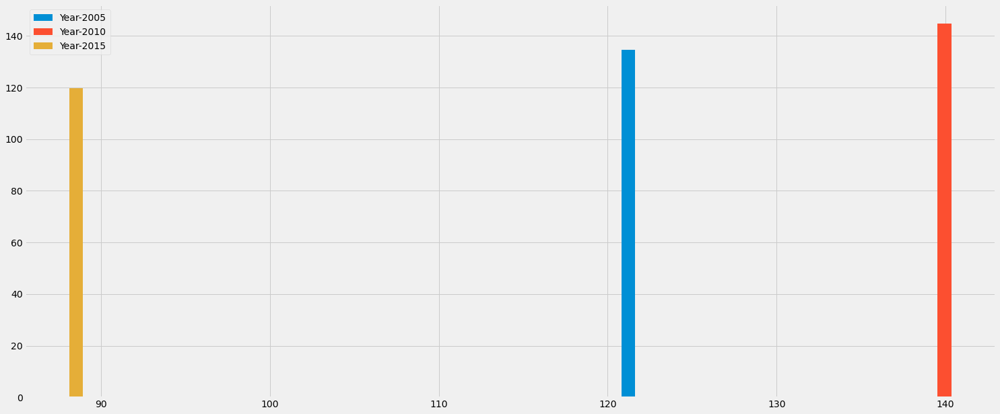

In [51]:
#2005
y_year_pred_2005 = reg.predict(X_year_2005)


#2010
y_year_pred_2010 = reg.predict(X_year_2010)
    
y_year_pred_2015 = reg.predict(X_year_2015)

print ("MEAN 2005")
print (np.mean(y_year_2005),np.mean(y_year_pred_2005))
print ("Standard deviation 2005")
print (np.sqrt(np.var(y_year_2005)),np.sqrt(np.var(y_year_pred_2005)))


print ("MEAN 2010")
print (np.mean(y_year_2010),np.mean(y_year_pred_2010))
print ("Standard deviation 2010")
print (np.sqrt(np.var(y_year_2010)),np.sqrt(np.var(y_year_pred_2010)))


print ("MEAN 2015")
print (np.mean(y_year_2015),np.mean(y_year_pred_2015))
print ("Standard deviation 2015")
print (np.sqrt(np.var(y_year_2015)),np.sqrt(np.var(y_year_pred_2015)))

plt.rcParams['figure.figsize']=(23,10)
plt.bar([np.mean(y_year_2005)],[np.mean(y_year_pred_2005)],label = "Year-2005")
plt.bar([np.mean(y_year_2010)],[np.mean(y_year_pred_2010)],label = "Year-2010")
plt.bar([np.mean(y_year_2015)],[np.mean(y_year_pred_2015)],label = "Year-2015")

plt.legend()
plt.show()

## NEURAL NETWORKS

**A neural network is a series of algorithms that endeavors to recognize underlying relationships in a set of data through a process that mimics the way the human brain operates. In this sense, neural networks refer to systems of neurons, either organic or artificial in nature. Neural networks can adapt to changing input; so the network generates the best possible result without needing to redesign the output criteria.**

In [52]:
from keras.models import Model
from keras.layers import Dense, Input, Conv1D, Flatten

# NN model
inputs = Input(shape=(3,1))
x = Conv1D(64, 2, padding='same', activation='elu')(inputs)
x = Conv1D(128, 2, padding='same', activation='elu')(x)
x = Flatten()(x)
x = Dense(128, activation='elu')(x)
x = Dense(64, activation='elu')(x)
x = Dense(32, activation='elu')(x)
x = Dense(1, activation='linear')(x)
model = Model(inputs=[inputs], outputs=[x])
model.compile(loss='mean_squared_error', optimizer='adamax', metrics=['mae'])
model.summary()
model.fit(x=np.expand_dims(X_train, axis=2), y=y_train, batch_size=64, epochs=10, verbose=1, validation_split=0.1, shuffle=True)
y_pred = model.predict(np.expand_dims(X_test, axis=2))
print (mean_absolute_error(y_test, y_pred))

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 3, 1)]            0         
_________________________________________________________________
conv1d (Conv1D)              (None, 3, 64)             192       
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 3, 128)            16512     
_________________________________________________________________
flatten (Flatten)            (None, 384)               0         
_________________________________________________________________
dense (Dense)                (None, 128)               49280     
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_2 (Dense)              (None, 32)               

# spliting training and testing data only for karnataka

In [53]:
KARNATAKA = np.asarray(India[['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL',
       'AUG', 'SEP', 'OCT', 'NOV', 'DEC']].loc[India['SUBDIVISION'] == 'COASTAL KARNATAKA'])

X = None; y = None
for i in range(KARNATAKA.shape[1]-3):
    if X is None:
        X = KARNATAKA[:, i:i+3]
        y = KARNATAKA[:, i+3]
    else:
        X = np.concatenate((X, KARNATAKA[:, i:i+3]), axis=0)
        y = np.concatenate((y, KARNATAKA[:, i+3]), axis=0)
        
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.01, random_state=42)

In [54]:
from sklearn import linear_model

# linear model
reg = linear_model.ElasticNet(alpha=0.5)
reg.fit(X_train, y_train)
y_pred = reg.predict(X_test)
print (mean_absolute_error(y_test, y_pred))

317.68534171120433


MEAN 2005
121.2111111111111 310.4567076829197
Standard deviation 2005
123.77066107608005 86.15036391500021
MEAN 2010
139.93333333333334 316.9015716879219
Standard deviation 2010
135.71320250194282 84.62465537869804
MEAN 2015
88.52222222222223 302.30904835522523
Standard deviation 2015
86.62446123324875 60.34560808168789


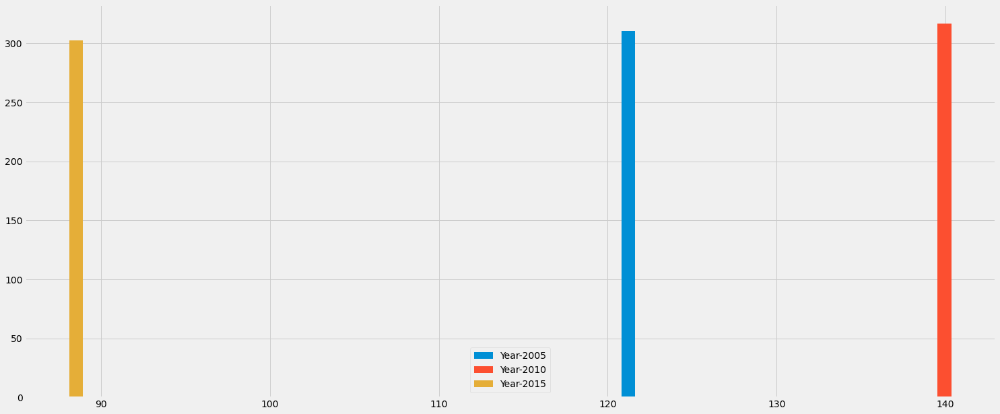

In [55]:
y_year_pred_2005 = reg.predict(X_year_2005)


#2010
y_year_pred_2010 = reg.predict(X_year_2010)
    
y_year_pred_2015 = reg.predict(X_year_2015)

print ("MEAN 2005")
print (np.mean(y_year_2005),np.mean(y_year_pred_2005))
print ("Standard deviation 2005")
print (np.sqrt(np.var(y_year_2005)),np.sqrt(np.var(y_year_pred_2005)))


print ("MEAN 2010")
print (np.mean(y_year_2010),np.mean(y_year_pred_2010))
print ("Standard deviation 2010")
print (np.sqrt(np.var(y_year_2010)),np.sqrt(np.var(y_year_pred_2010)))


print ("MEAN 2015")
print (np.mean(y_year_2015),np.mean(y_year_pred_2015))
print ("Standard deviation 2015")
print (np.sqrt(np.var(y_year_2015)),np.sqrt(np.var(y_year_pred_2015)))
plt.rcParams['figure.figsize']=(23,10)
plt.bar([np.mean(y_year_2005)],[np.mean(y_year_pred_2005)],label = "Year-2005")
plt.bar([np.mean(y_year_2010)],[np.mean(y_year_pred_2010)],label = "Year-2010")
plt.bar([np.mean(y_year_2015)],[np.mean(y_year_pred_2015)],label = "Year-2015")

plt.legend()
plt.show()

**SVM FOR KARNATAKA**

In [56]:
from sklearn.svm import SVR

# SVM model
clf = SVR(kernel='rbf', gamma='auto', C=0.5, epsilon=0.2)
clf.fit(X_train, y_train) 
y_pred = clf.predict(X_test)
print (mean_absolute_error(y_test, y_pred))

498.82069251948127


MEAN 2005
121.2111111111111 310.4567076829197
Standard deviation 2005
123.77066107608005 86.15036391500021
MEAN 2010
139.93333333333334 316.9015716879219
Standard deviation 2010
135.71320250194282 84.62465537869804
MEAN 2015
88.52222222222223 302.30904835522523
Standard deviation 2015
86.62446123324875 60.34560808168789


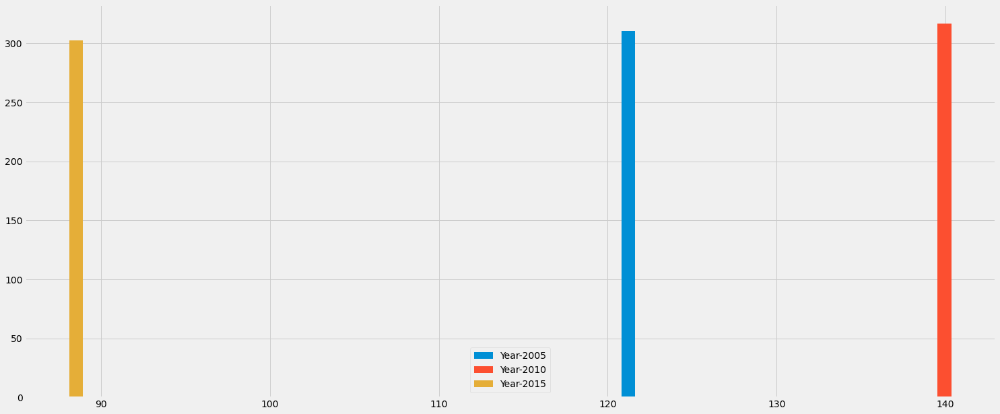

In [57]:
#2005
y_year_pred_2005 = reg.predict(X_year_2005)


#2010
y_year_pred_2010 = reg.predict(X_year_2010)
    
y_year_pred_2015 = reg.predict(X_year_2015)

print ("MEAN 2005")
print (np.mean(y_year_2005),np.mean(y_year_pred_2005))
print ("Standard deviation 2005")
print (np.sqrt(np.var(y_year_2005)),np.sqrt(np.var(y_year_pred_2005)))


print ("MEAN 2010")
print (np.mean(y_year_2010),np.mean(y_year_pred_2010))
print ("Standard deviation 2010")
print (np.sqrt(np.var(y_year_2010)),np.sqrt(np.var(y_year_pred_2010)))


print ("MEAN 2015")
print (np.mean(y_year_2015),np.mean(y_year_pred_2015))
print ("Standard deviation 2015")
print (np.sqrt(np.var(y_year_2015)),np.sqrt(np.var(y_year_pred_2015)))
plt.rcParams['figure.figsize']=(23,10)
plt.bar([np.mean(y_year_2005)],[np.mean(y_year_pred_2005)],label = "Year-2005")
plt.bar([np.mean(y_year_2010)],[np.mean(y_year_pred_2010)],label = "Year-2010")
plt.bar([np.mean(y_year_2015)],[np.mean(y_year_pred_2015)],label = "Year-2015")

plt.legend()
plt.show()

**ANN FOR KARNATAKA**

In [58]:
model.fit(x=np.expand_dims(X_train, axis=2), y=y_train, batch_size=64, epochs=10, verbose=1, validation_split=0.1, shuffle=True)
y_pred = model.predict(np.expand_dims(X_test, axis=2))
print (mean_absolute_error(y_test, y_pred))

Epoch 1/10
15/15 [==============================] - 0s 7ms/step - loss: 92547.1094 - mae: 192.6094 - val_loss: 78179.4219 - val_mae: 182.7389
Epoch 2/10
15/15 [==============================] - 0s 4ms/step - loss: 83449.3672 - mae: 181.8890 - val_loss: 73402.5625 - val_mae: 178.8977
Epoch 3/10
15/15 [==============================] - 0s 4ms/step - loss: 78396.6875 - mae: 182.3439 - val_loss: 68703.5469 - val_mae: 178.2852
Epoch 4/10
15/15 [==============================] - 0s 4ms/step - loss: 75002.9219 - mae: 179.2045 - val_loss: 66691.8359 - val_mae: 178.7149
Epoch 5/10
15/15 [==============================] - 0s 4ms/step - loss: 70451.2188 - mae: 176.6150 - val_loss: 62325.1562 - val_mae: 171.5536
Epoch 6/10
15/15 [==============================] - 0s 4ms/step - loss: 66285.1016 - mae: 172.1476 - val_loss: 59724.7578 - val_mae: 168.4287
Epoch 7/10
15/15 [==============================] - 0s 4ms/step - loss: 63605.3750 - mae: 169.4745 - val_loss: 55527.4766 - val_mae: 162.8497
Epoch 

MEAN 2005
121.2111111111111 310.4567076829197
Standard deviation 2005
123.77066107608005 86.15036391500021
MEAN 2010
139.93333333333334 316.9015716879219
Standard deviation 2010
135.71320250194282 84.62465537869804
MEAN 2015
88.52222222222223 302.30904835522523
Standard deviation 2015
86.62446123324875 60.34560808168789


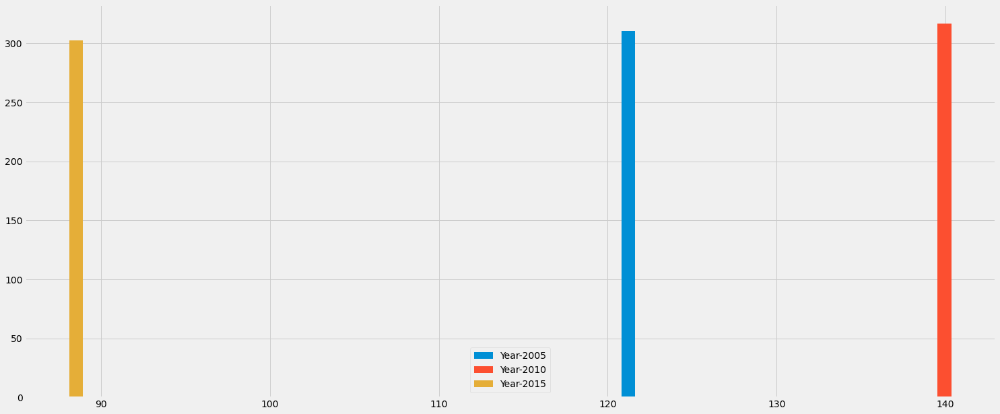

In [59]:
#2005
y_year_pred_2005 = reg.predict(X_year_2005)


#2010
y_year_pred_2010 = reg.predict(X_year_2010)
    
y_year_pred_2015 = reg.predict(X_year_2015)

print ("MEAN 2005")
print (np.mean(y_year_2005),np.mean(y_year_pred_2005))
print ("Standard deviation 2005")
print (np.sqrt(np.var(y_year_2005)),np.sqrt(np.var(y_year_pred_2005)))


print ("MEAN 2010")
print (np.mean(y_year_2010),np.mean(y_year_pred_2010))
print ("Standard deviation 2010")
print (np.sqrt(np.var(y_year_2010)),np.sqrt(np.var(y_year_pred_2010)))


print ("MEAN 2015")
print (np.mean(y_year_2015),np.mean(y_year_pred_2015))
print ("Standard deviation 2015")
print (np.sqrt(np.var(y_year_2015)),np.sqrt(np.var(y_year_pred_2015)))
plt.rcParams['figure.figsize']=(23,10)
plt.bar([np.mean(y_year_2005)],[np.mean(y_year_pred_2005)],label = "Year-2005")
plt.bar([np.mean(y_year_2010)],[np.mean(y_year_pred_2010)],label = "Year-2010")
plt.bar([np.mean(y_year_2015)],[np.mean(y_year_pred_2015)],label = "Year-2015")

plt.legend()
plt.show()

Training on complete dataset:

Algorithm MAE(Mean-Absolute-Error)
                     
        Linear Regression----------- 96.94 
        SVR------------------------- 126.136 
        Artificial Neural Networks-- 88.2648**

Training on KARNATAKA dataset:

Algorithm MAE(Mean-Absolute-Error)

    Linear Regression----------- 317.68534171
    Support Vector Machine------ 498.82069252
    Artificial Neural Networks-- 253.24107943

Neural Networks performs better than SVR etc.
Observed MAE is very high which indicates machine learning models won't work well for prediction of rainfall.
ORISSA data has a single pattern that can be learned by models, rather than learning different patterns of all states. so has high accuracy.
Analysed individual year rainfall patterns for 2005, 2010, 2015.
Approximately close means, noticed less standard deviations.**